# Importing Libraries

In [7]:
# Necati Furkan Çolak
import numpy as np
import pandas as pd

In [8]:
np.float = float

In [9]:
# Import the necessary libraries
from skmultiflow.data import AGRAWALGenerator
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.meta import StreamingRandomPatchesClassifier
from skmultiflow.meta import DynamicWeightedMajorityClassifier
from skmultiflow.lazy import SAMKNNClassifier
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.drift_detection import ADWIN
from skmultiflow.evaluation import EvaluatePrequential
from skmultiflow.data import DataStream
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [10]:
from skmultiflow.drift_detection import PageHinkley

# Datasets Generation and Dataset load:

In [11]:
# Create AGRAWAL and SEA generators
agrawal_generator = AGRAWALGenerator(random_state=1) 
sea_generator = SEAGenerator(random_state=1)  

agrawal_data, agrawal_target = [], []  # Lists to store AGRAWAL data and target values
sea_data, sea_target = [], []  # Lists to store SEA data and target values

# Generate data samples for AGRAWAL and SEA datasets
for _ in range(100000):
    agrawal_X, agrawal_y = agrawal_generator.next_sample()  # Generate AGRAWAL data and target value
    sea_X, sea_y = sea_generator.next_sample()  # Generate SEA data and target value
    
    # Append the data and target values to the respective lists
    agrawal_data.append(agrawal_X[0])  # Append AGRAWAL data to the list
    agrawal_target.append(agrawal_y[0])  # Append AGRAWAL target value to the list
    sea_data.append(sea_X[0])  # Append SEA data to the list
    sea_target.append(sea_y[0])  # Append SEA target value to the list

# Save AGRAWAL dataset as CSV file
np.savetxt('AGRAWALDataset.csv', np.hstack((agrawal_data, np.array(agrawal_target)[:, None])), delimiter=',')

# Save SEA dataset as CSV file
np.savetxt('SEADataset.csv', np.hstack((sea_data, np.array(sea_target)[:, None])), delimiter=',')

# Read the spam, elec, AGRAWAL, and SEA datasets as DataFrames
spam = pd.read_csv('spam.csv')  
elec = pd.read_csv('elec.csv')  
agrawal = pd.read_csv('AGRAWALDataset.csv', header=None)  
sea = pd.read_csv('SEADataset.csv', header=None)  

# Models:

## Electricity Data:

In [13]:
X_elec = elec.iloc[:, :-1]  # Get the feature columns
y_elec = elec.iloc[:, -1].values  # Get the target variable column

# Create a data stream
elec_stream = DataStream(X_elec, y_elec)

# Split the initial batch from the stream
X_initial, y_initial = elec_stream.next_sample(batch_size=1)  # Get the initial batch
X_elec, y_elec = elec_stream.next_sample()  # Get the remaining samples


primary_clf = HoeffdingTreeClassifier()  # Create a Hoeffding Adaptive Tree classifier as the primary classifier
alternate_clfs = [AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]  # Create a list of alternative classifiers


primary_clf.partial_fit(X_initial, y_initial)  # Initialize the primary classifier using the initial batch
for clf in alternate_clfs:
    clf.partial_fit(X_initial, y_initial)  # Initialize the alternative classifiers using the initial batch


primary_adwin = ADWIN()  # Create an ADWIN change detector for the primary classifier
alternate_adwins = [ADWIN() for _ in alternate_clfs]  # Create ADWIN change detectors for the alternative classifiers


primary_correct_predictions = 0  # Counter for correct predictions of the primary classifier
alternate_correct_predictions = [0] * len(alternate_clfs)  # Counter for correct predictions of the alternative classifiers

n_samples = 0  # Counter for the number of samples processed
primary_accuracies_elec = []  # List to store the primary classifier accuracies over time

window_size = max(len(y_elec) // 20, 1)  # Calculate the window size for prequential evaluation
sliding_window_accuracies = []  # List to store the sliding window accuracies

# For each data stream
for stream_name, stream in [("Elec", elec_stream)]:
    print(f"Processing {stream_name} dataset")
    while stream.has_more_samples():
        X, y = stream.next_sample()  # Get the next sample from the stream

        # Make predictions with all classifiers
        primary_y_pred = primary_clf.predict(X)  # Predict with the primary classifier
        alternate_y_preds = [clf.predict(X) for clf in alternate_clfs]  # Predict with the alternative classifiers

        # If primary classifier is correct, update it
        if y == primary_y_pred:
            primary_correct_predictions += 1
            primary_clf.partial_fit(X, y)

        # If any alternate classifier is correct, update it
        for i, clf in enumerate(alternate_clfs):
            if y == alternate_y_preds[i]:
                alternate_correct_predictions[i] += 1
                clf.partial_fit(X, y)

        # Update ADWIN for primary classifier and check for drift
        primary_adwin.add_element(int(y != primary_y_pred))

        if n_samples > 0:  
            if primary_adwin.detected_change():
                correct_prediction_rates = [correct / n_samples for correct in alternate_correct_predictions]
                best_clf_index = np.argmax(correct_prediction_rates)
                primary_clf, alternate_clfs[best_clf_index] = alternate_clfs[best_clf_index], primary_clf
                primary_adwin, alternate_adwins[best_clf_index] = alternate_adwins[best_clf_index], primary_adwin
                primary_correct_predictions, alternate_correct_predictions[best_clf_index] = alternate_correct_predictions[best_clf_index], primary_correct_predictions

                print(f"Drift detected at sample {n_samples} in {stream_name} dataset. Primary classifier has been changed to {type(primary_clf).__name__}.")

        n_samples += 1

        primary_accuracy = primary_correct_predictions / n_samples  # Calculate the primary classifier accuracy
        primary_accuracies_elec.append(primary_accuracy)  # Store the primary classifier accuracy in the list

        # If the number of samples is a multiple of the window size, calculate and store the prequential accuracy
        if n_samples % window_size == 0:
            start = n_samples - window_size
            prequential_accuracy = sum(primary_accuracies_elec[start:n_samples]) / window_size
            sliding_window_accuracies.append(prequential_accuracy)

        print(f"Primary classifier ({type(primary_clf).__name__}) accuracy: {prequential_accuracy:.4f}")


Processing Elec dataset
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3333
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6667
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7500
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6667
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5455
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5833
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6429
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6667
Primary classifier (HoeffdingTreeClassifier) a

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4682
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4655
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4659
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4633
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4663
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4751
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4780
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4809
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4837
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4865
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4892
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5852
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5833
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5815
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5796
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5778
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5759
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5705
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5670
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5652
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5635
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5617
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5600
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5583
Primary 

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5478
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5487
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5497
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5506
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5495
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5483
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5472
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5460
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5449
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5437
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5426
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5436
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5445
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5625
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5616
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5606
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5597
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5587
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5578
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5559
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5550
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5541
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5532
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5522
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5513
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5186
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5179
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5172
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5165
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5158
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5152
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5145
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5138
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5131
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5125
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5118
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5111
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5104
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5158
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5164
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5169
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5174
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5180
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5185
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5190
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5195
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5200
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5206
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5211
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5216
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5221
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6251
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6255
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6258
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6261
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6265
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6268
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6271
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6275
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6278
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6281
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6285
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6288
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6291
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6719
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6722
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6724
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6729
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6735
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6737
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6740
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6742
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6745
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6747
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6750
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6752
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6924
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6926
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6928
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6930
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6932
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6934
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6936
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6938
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6941
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6943
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6945
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6947
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6949
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6951
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6992
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6994
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6996
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6998
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7000
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7002
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7004
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7006
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7008
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7010
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7011
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7013
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7015
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7017
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5980
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5977
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5973
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5970
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5972
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5969
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5965
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5967
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5970
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5966
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5969
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5971
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5973
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6017
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6014
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6007
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6004
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6006
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6008
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6013
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6015
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6017
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6019
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6021
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6012
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6009
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6006
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6003
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6000
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5997
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5994
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5996
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5998
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6000
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6002
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6004
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6006
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6063
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6065
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6062
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6065
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6067
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6069
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6071
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6068
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6070
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6072
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6074
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6075
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6034
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6032
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6029
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6026
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6024
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6021
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6018
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6016
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6013
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6008
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6005
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6003
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5935
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5933
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5930
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5932
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5933
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5935
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5937
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5939
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5940
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5942
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5939
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5937
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5939
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5952
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5949
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5947
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5944
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5946
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5948
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5949
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5951
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5952
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5954
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5956
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5953
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5955
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5924
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5922
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5920
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5918
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5915
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5913
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5911
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5909
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5907
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5904
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5902
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5900
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5898
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5878
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5876
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5877
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5875
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5877
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5878
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5880
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5881
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5883
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5884
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5885
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5887
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5888
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5993
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5991
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5993
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5994
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5995
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5993
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5995
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5996
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5994
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5992
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5990
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5988
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5986
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5977
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5978
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5979
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5980
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5979
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5977
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5975
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5973
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5974
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5972
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5973
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5975
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5976
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5930
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5928
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5926
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5924
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5923
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5921
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5919
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5917
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5918
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5920
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5921
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5922
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5923
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5875
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5873
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5872
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5870
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5868
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5867
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5865
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5863
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5861
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5860
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5858
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5859
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5860
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5919
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5920
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5921
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5922
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5923
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5924
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5926
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5927
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5928
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5929
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5930
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5931
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5932
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6926
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6926
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6927
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6928
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6929
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6930
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6928
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6929
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6927
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6928
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6928
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6929
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6930
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6931
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6024
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6022
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6021
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6019
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6018
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6016
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6014
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6013
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6008
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6007
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6005
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6037
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6035
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6034
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6032
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6031
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6029
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6028
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6026
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6025
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6023
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6024
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6025
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6026
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7114
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7112
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7113
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7113
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7114
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7118
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7184
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7184
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7185
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7185
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7186
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7188
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7189
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7185
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7184
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7184
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7185
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7185
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7186
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7186
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7188
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7188
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7185
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7183
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7182
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7180
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7179
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7177
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.7178
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6054
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6054
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6055
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6056
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6057
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6058
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6059
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6060
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6060
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6061
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6062
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6063
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6065
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6063
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6065
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6066
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6067
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6068
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6069
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6069
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6090
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6089
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6088
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6086
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6087
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6086
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6087
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6087
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6088
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6089
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6090
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6091
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6091
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6075
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6075
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6076
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6077
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6078
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6079
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6079
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6080
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6081
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6082
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6082
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6083
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6084
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6087
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6086
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6085
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6084
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6083
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6081
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6080
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6079
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6078
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6077
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6076
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6074
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6073
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6097
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6096
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6094
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6095
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6096
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6095
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6094
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6094
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6095
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6096
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6097
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6097
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6098
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6050
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6049
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6048
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6047
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6045
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6044
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6043
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6042
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6043
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6044
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6044
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6045
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6044
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6107
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6108
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6109
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6110
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6110
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6109
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6108
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6109
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6110
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6108
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6107
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6106
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6105
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6063
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6062
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6061
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6060
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6059
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6058
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6057
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6057
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6058
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6059
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6059
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6060
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6061
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6053
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6052
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6051
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6051
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6052
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6051
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6052
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6052
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6053
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6052
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6053
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6052
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6051
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6062
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6062
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6061
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6062
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6063
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6063
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6064
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6065
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6065
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6066
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6067
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6066
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6065
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6039
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6038
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6038
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6037
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6038
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6037
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6036
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6035
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6034
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6033
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6032
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6031
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6030
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6000
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6001
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6002
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6002
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6001
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6000
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6001
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6000
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5999
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5998
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5997
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5996
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5995
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6017
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6018
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6017
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6016
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6015
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6014
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6013
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6012
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6009
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6009
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6025
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6024
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6023
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6024
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6024
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6025
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6026
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6026
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6027
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6027
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6028
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6029
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6029
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6033
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6032
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6031
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6030
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6029
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6028
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6027
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6028
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6027
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6026
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6025
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6024
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6023
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6036
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6036
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6037
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6038
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6038
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6037
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6036
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6036
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6035
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6034
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6033
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6032
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6031
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6040
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6039
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6038
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6038
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6037
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6036
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6035
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6034
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6033
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6032
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6031
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6031
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6030
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6019
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6018
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6018
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6017
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6016
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6015
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6014
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6013
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6012
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6012
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6009
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6009
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6009
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6010
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6011
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6012
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6012
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6013
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5966
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5965
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5964
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5965
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5964
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5963
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5962
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5962
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5962
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5963
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5963
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5964
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5964
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5943
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5942
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5942
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5941
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5940
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5939
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5938
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5938
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5937
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5937
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5938
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5938
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5939
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6911
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6911
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6911
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6912
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6912
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6913
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6913
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6913
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6914
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6914
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6915
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6915
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6915
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6916
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5897
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5896
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5896
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5895
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5894
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5893
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5893
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5892
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5891
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5890
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5890
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5889
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5888
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5878
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5878
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5878
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5877
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5876
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5875
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5875
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5874
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5873
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5872
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5872
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5871
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5871
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5853
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5853
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5853
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5854
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5854
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5855
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5855
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5840
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5840
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5840
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5840
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5840
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5840
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5819
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5818
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5819
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5818
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5818
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5816
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5815
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5816
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5816
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5818
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6843
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6843
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6843
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6844
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6844
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6845
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6845
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6845
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6844
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6844
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6843
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6842
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6841
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6840
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6824
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6824
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6824
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6823
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6822
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6821
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6821
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6820
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6819
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6818
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6817
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6817
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6817
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6817
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6809
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6808
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6809
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6809
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6810
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6810
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6810
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6811
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6811
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6811
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6812
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6812
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6812
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6813
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5746
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5746
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5745
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5746
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5746
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5745
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5745
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5744
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5744
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5726
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5728
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5728
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5729
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5729
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5730
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5730
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6722
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6722
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6722
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6721
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6721
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6719
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6719
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6715
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6714
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6713
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6713
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6711
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6710
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6710
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6672
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6672
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6672
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6673
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6673
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6673
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6674
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6674
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6675
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6675
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6675
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6676
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6676
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6676
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6647
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6647
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6647
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6648
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6648
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6648
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6648
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6647
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6645
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6623
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6623
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6619
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6596
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6596
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6596
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6597
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6597
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6597
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6598
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6598
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6598
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6599
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6599
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6598
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6598
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6597
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6575
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6575
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6579
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6579
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6579
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6579
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6581
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6581
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6571
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6572
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6572
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6572
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6572
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6572
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6571
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6571
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6570
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6570
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6569
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6568
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6568
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6567
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6543
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6542
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6541
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6541
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6541
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6541
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6542
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6542
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6542
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6543
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6543
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6543
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6544
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6544
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6515
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6515
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6515
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6516
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6516
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6516
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6517
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6517
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6516
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6517
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6517
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6517
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6518
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6518
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6487
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6487
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6486
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6487
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6486
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6485
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6485
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6483
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6481
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6467
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6467
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6467
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6467
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6463
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6463
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6462
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6429
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6429
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6429
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6428
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6428
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6428
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6428
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6429
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6429
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6429
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6429
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6430
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6430
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6430
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6400
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6401
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6401
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6401
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6400
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6399
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6399
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6398
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6398
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6396
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6369
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6369
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6369
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6370
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6370
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6370
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6370
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6371
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6371
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6371
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6370
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6369
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6369
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6368
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6343
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6342
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6342
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6341
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6341
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6341
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6340
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6340
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6339
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6339
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6339
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6339
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6339
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6340
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6323
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6323
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6323
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6328
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6328
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6328
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6329
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6329
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6329
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6331
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6303
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6302
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6301
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6301
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6300
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6300
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6299
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6299
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6298
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6298
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6297
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6297
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6296
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6296
Drift 

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6298
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6298
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6297
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6297
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6297
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6298
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6298
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6297
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6297
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6296
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6296
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6295
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6295
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6294
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6274
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6274
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6274
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6274
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6275
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6275
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6275
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6275
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6274
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6274
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6274
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6273
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6273
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6272
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6236
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6236
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6236
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6236
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6238
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6238
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6237
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6230
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6230
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6231
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6231
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6231
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6232
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6232
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6232
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6233
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6233
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6233
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6234
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6233
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6233
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6228
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6228
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6228
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6228
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6229
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6229
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6229
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6230
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6230
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6230
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6231
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6231
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6231
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6231
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6191
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6192
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6192
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6192
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6193
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6193
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6193
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6194
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6194
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6194
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6194
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6195
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6195
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6195
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6190
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6191
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6190
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6190
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6189
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6189
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6188
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6188
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6186
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6186
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6185
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6185
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5582
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5581
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5581
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5580
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5580
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5580
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5579
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5579
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5578
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5578
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5578
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5578
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5577
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5578
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5579
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5579
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5579
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5580
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5580
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5580
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5581
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5581
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5581
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5582
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5582
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5582
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6154
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6154
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6155
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6155
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6155
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6156
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6156
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6156
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6156
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6157
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6157
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6157
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6158
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6158
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6135
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6135
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6135
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6135
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6135
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6135
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6136
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6136
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6135
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6132
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6132
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6130
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6130
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6131
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6131
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6131
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6132
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6132
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6132
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6132
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6133
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6134
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6120
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6120
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6123
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6124
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6124
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6124
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6124
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6123
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6123
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6122
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6122
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6122
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6123
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6122
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6122
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6121
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6096
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6096
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6097
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6097
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6097
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6099
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6099
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6099
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6099
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6100
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6093
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6093
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6093
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6092
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6092
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6091
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6091
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6090
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6090
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6090
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6090
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6090
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6090
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6091
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6094
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6095
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6095
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6095
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6096
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6096
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6096
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6096
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6097
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6097
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6097
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6097
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6103
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6100
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6100
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6099
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6099
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6098
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6099
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5518
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5518
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5518
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5518
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5518
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5517
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5536
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5537
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5537
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5537
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5538
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5538
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5538
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5539
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5539
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5539
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5540
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5540
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5540
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5540
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5532
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5533
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5534
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5535
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5552
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5552
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5552
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5551
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5550
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5550
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5555
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5555
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5554
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5562
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5562
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5562
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5558
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5558
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5558
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5556
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5558
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5558
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5558
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5558
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5556
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5557
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5556
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5556
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5556
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5556
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5570
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5570
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6247
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6247
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6247
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6247
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6246
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6246
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6245
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6245
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6245
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6244
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6244
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6243
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6243
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5566
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5566
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5566
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5567
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5566
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5566
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5566
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5565
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5564
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5563
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5568
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5570
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5569
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5590
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5591
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5591
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5591
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5593
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5593
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5592
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5592
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5593
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5593
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5593
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5593
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5594
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5594
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5594
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5595
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5595
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5600
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5600
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5600
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5600
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5601
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5602
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5615
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5615
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5615
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5613
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5613
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5613
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5612
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5612
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5612
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5611
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6114
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6114
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6100
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6100
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6100
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6101
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6102
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6119
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6120
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6120
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6120
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6120
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6120
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6121
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6121
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6121
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6121
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6122
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6128
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6128
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6128
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6128
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6129
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6128
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6128
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6128
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6127
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6126
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6125
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6125
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6125
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6125
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6138
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6138
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6138
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6139
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6139
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6139
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6139
Drift detected at sample 18144 in Elec dataset. Primary classifier has been changed to DynamicWeightedMajorityClassifier.
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5627
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5627
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5627
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (D

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5628
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5637
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5637
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5637
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5637
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5637
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5638
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5638
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5638
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5638
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6176
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6177
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6177
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6177
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6177
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6177
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6178
Drift detected at sample 18528 in Elec dataset. Primary classifier has been changed to DynamicWeightedMajorityClassifier.
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5648
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5648
Primary classifier (D

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5658
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5657
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5657
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5657
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5657
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5655
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5655
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6225
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6225
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6225
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6225
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6225
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6226
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6226
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6226
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6226
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6226
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6227
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6227
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6227
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6227
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6247
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6247
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6247
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6248
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5660
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5659
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5659
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5659
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5659
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5658
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5658
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5658
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5657
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5657
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5657
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5656
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5645
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5645
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5645
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5645
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5645
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5646
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5647
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5648
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5648
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5648
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5648
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5641
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5640
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5639
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5638
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5638
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5638
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5632
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5630
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5630
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5630
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5631
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5630
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5630
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5630
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5630
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5629
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5616
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5615
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5615
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5615
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5613
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5613
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5614
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6306
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6306
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6306
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6306
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6306
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6306
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6307
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6326
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6327
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6315
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6315
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6317
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6316
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6317
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6317
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6317
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6324
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6325
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6320
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6320
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6320
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6320
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6320
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6321
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6322
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6329
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6329
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6330
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6331
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6331
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6331
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6331
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6331
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6331
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6332
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6346
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6347
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6347
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6347
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6347
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6347
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6347
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6348
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6348
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6348
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6348
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6348
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6348
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6349
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6364
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6364
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6365
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6365
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6365
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6365
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6365
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6365
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6366
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6366
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6366
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6366
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6366
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6366
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6386
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6386
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6386
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6386
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6387
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6386
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6387
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6387
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6387
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6387
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6387
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6387
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6388
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6388
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6396
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6397
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6396
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6396
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6396
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6396
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6395
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6395
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6407
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6407
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6408
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6409
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6409
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6409
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6409
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5688
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5688
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5690
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5689
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5701
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5705
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5706
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5709
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5707
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5708
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5697
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5697
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5700
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5698
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5699
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6454
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6454
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6454
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6453
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6453
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6453
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6453
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6453
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6452
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6453
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6456
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6456
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6456
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6455
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6456
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6456
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6456
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6456
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6467
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6463
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6463
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6463
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6462
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6462
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6462
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6462
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6462
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6462
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6477
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6477
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6477
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6477
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6478
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6473
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6473
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6471
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6471
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6471
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6471
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6464
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6465
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6466
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6475
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6477
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6477
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6477
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6483
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6483
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6483
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6483
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6483
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6482
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6481
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6494
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6491
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6491
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6486
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6486
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6485
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6485
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6485
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6484
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6495
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6495
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6494
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6494
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6494
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6494
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6493
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6492
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5735
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5734
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5734
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5734
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5734
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5734
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5733
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5733
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5733
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5733
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5733
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6519
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6519
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6519
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6519
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6519
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6519
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6520
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6520
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6520
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6520
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6520
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6520
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6520
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6521
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6535
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6535
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6535
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6535
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6536
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6536
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6536
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6536
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6536
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6536
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6536
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6535
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6535
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6535
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6545
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6545
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6545
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6546
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6547
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6547
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6560
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6562
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6562
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6562
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6562
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6562
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6562
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6576
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6577
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6578
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6580
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6589
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6590
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6590
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6602
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6602
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6602
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6602
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6602
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6602
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6602
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6601
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6601
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6601
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6601
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6601
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6601
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6601
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6608
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6625
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6625
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6625
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6625
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6625
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6625
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6626
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6623
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6623
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6622
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6623
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6623
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6630
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6630
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6630
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6630
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6630
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6629
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6629
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6629
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6629
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6629
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6631
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6630
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6630
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5728
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5728
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5728
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5728
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5728
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5727
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5726
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5726
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5726
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5731
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5732
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5733
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5741
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5745
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5745
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5745
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5744
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5744
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5744
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5744
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5744
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5743
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5742
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5766
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5763
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5785
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6651
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6647
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6645
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6645
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6645
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6645
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6645
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6646
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6645
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5782
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5787
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5786
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5787
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5786
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5786
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5786
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5786
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5786
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5786
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5785
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5785
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5785
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5785
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5785
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5792
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5792
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5792
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5791
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5789
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5789
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5789
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5788
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5789
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5779
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5779
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5779
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5779
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5779
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5779
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5778
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5777
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5776
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5767
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5771
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5770
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5768
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5769
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5784
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5783
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5775
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5774
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5764
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5765
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5773
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5772
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5781
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5780
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6610
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6610
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6610
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6610
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6610
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6610
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6610
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6614
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6614
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6614
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6627
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6628
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6636
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6637
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6637
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6644
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6644
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6644
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6644
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6644
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6643
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6652
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6653
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6660
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6660
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6660
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6660
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6661
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6662
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6669
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6664
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6664
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6664
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6665
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5828
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5828
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5828
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5828
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5828
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5828
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5826
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5826
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5826
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5826
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5827
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5826
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5831
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5831
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5831
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5831
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5831
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5831
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5831
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5834
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5834
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5835
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5836
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5836
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5841
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5842
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5842
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5842
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5842
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5842
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5842
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5842
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5851
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5848
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5848
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5848
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5848
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5853
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5852
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5853
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5847
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5850
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5849
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5846
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5845
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5844
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5839
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5838
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5837
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5836
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5836
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5836
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5833
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5832
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5830
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5829
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5823
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5823
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5824
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5816
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5816
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5817
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5809
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5809
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5809
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5809
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5809
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5808
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5808
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5808
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5808
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5808
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5808
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5808
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5807
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5802
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5801
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5801
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5801
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5801
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5801
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5801
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5797
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5798
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5797
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5796
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5796
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5796
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5796
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5796
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5796
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5795
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5795
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5795
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5795
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5795
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5795
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5795
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6696
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6696
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6696
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6697
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6700
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6700
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6699
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6704
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6708
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6708
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6708
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6708
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6709
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6711
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6711
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6711
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6712
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6715
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6716
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6719
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6719
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6719
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6719
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6718
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6720
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6721
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6721
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6721
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6721
Primar

Drift detected at sample 41856 in Elec dataset. Primary classifier has been changed to StreamingRandomPatchesClassifier.
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6726
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6726
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6726
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6726
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6727
Primary classifier (Streami

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6731
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6731
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6731
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6732
Primar

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5749
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5751
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5750
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5748
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5747
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5752
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5758
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5759
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5757
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5756
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5762
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5761
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5760
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5755
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5753
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy: 0.5754
Primary classifier (DynamicWeightedMajorityClassifier) accuracy:

## Plot of Electrictiy Data:

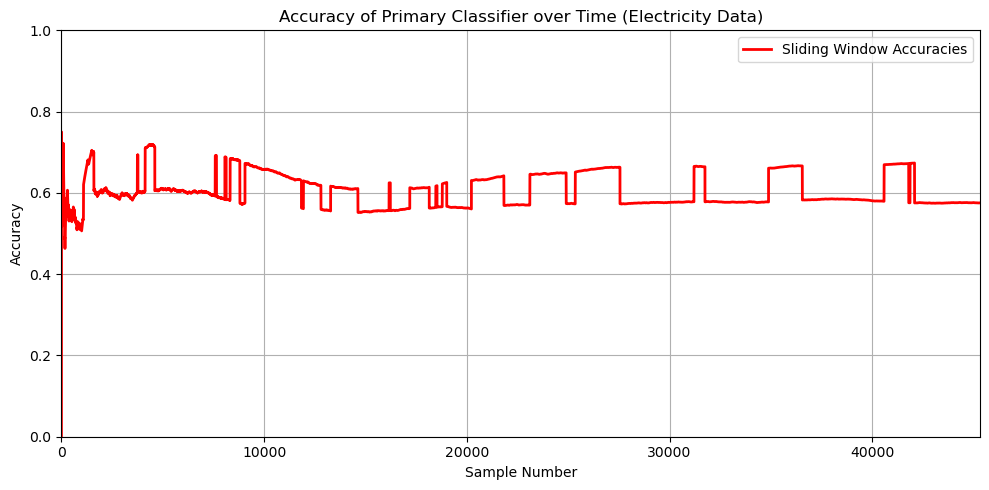

In [15]:
fig, ax = plt.subplots(figsize=(10, 5))  # Create a figure and axis with the specified size

ax.plot([i * window_size for i in range(len(sliding_window_accuracies))], sliding_window_accuracies, color='r', label='Sliding Window Accuracies', linestyle='-', linewidth=2)  
# Plot the sliding window accuracies as a line chart with 
# specified color, label, linestyle, and linewidth

ax.set_xlabel('Sample Number')  # Set the x-axis label
ax.set_ylabel('Accuracy')  # Set the y-axis label
ax.set_title('Accuracy of Primary Classifier over Time (Electricity Data)')  # Set the title of the plot

ax.grid(True)  # Enable grid lines in the plot

ax.set_xlim(0, (len(sliding_window_accuracies) - 1) * window_size)  # Set the x-axis limits dynamically based on the number of samples and window size
ax.set_ylim(0, 1)  # Set the y-axis limits from 0 to 1

ax.legend()  # Show the legend

plt.tight_layout()  # Adjust the layout of the plot

plt.savefig('elec_plot.png')  # Save the plot 

plt.show()  # Show the plot


## Spam Data:

In [16]:
X_spam = spam.iloc[:, :-1]  # Get the feature columns
y_spam = spam.iloc[:, -1].values  # Get the target variable column

# Create a data stream
spam_stream = DataStream(X_spam, y_spam)

X_initial, y_initial = spam_stream.next_sample(batch_size=1)  # Get the initial batch
X_spam, y_spam = spam_stream.next_sample()  # Get the remaining samples

primary_clf = HoeffdingTreeClassifier()  # Create a Hoeffding Adaptive Tree classifier as the primary classifier
alternate_clfs = [AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]  # Create a list of alternative classifiers

primary_clf.partial_fit(X_initial, y_initial)  # Initialize the primary classifier using the initial batch
for clf in alternate_clfs:
    clf.partial_fit(X_initial, y_initial)  # Initialize the alternative classifiers using the initial batch

primary_adwin = ADWIN()  # Create an ADWIN change detector for the primary classifier
alternate_adwins = [ADWIN() for _ in alternate_clfs]  # Create ADWIN change detectors for the alternative classifiers

primary_correct_predictions = 0  # Counter for correct predictions of the primary classifier
alternate_correct_predictions = [0] * len(alternate_clfs)  # Counter for correct predictions of the alternative classifiers

n_samples = 0  # Counter for the number of samples processed
primary_accuracies_spam = []  # List to store the primary classifier accuracies over time

window_size = max(len(y_spam) // 20, 1)  # Calculate the window size for prequential evaluation
sliding_window_accuracies_spam = []  # List to store the sliding window accuracies

for stream_name, stream in [("Spam", spam_stream)]:
    print(f"Processing {stream_name} dataset")
    while stream.has_more_samples():
        X, y = stream.next_sample()  # Get the next sample from the stream

        # Make predictions with all classifiers
        primary_y_pred = primary_clf.predict(X)  # Predict with the primary classifier
        alternate_y_preds = [clf.predict(X) for clf in alternate_clfs]  # Predict with the alternative classifiers

        # If primary classifier is correct, update it
        if y == primary_y_pred:
            primary_correct_predictions += 1
            primary_clf.partial_fit(X, y)

        # If any alternate classifier is correct, update it
        for i, clf in enumerate(alternate_clfs):
            if y == alternate_y_preds[i]:
                alternate_correct_predictions[i] += 1
                clf.partial_fit(X, y)

        # Update ADWIN for primary classifier and check for drift
        primary_adwin.add_element(int(y != primary_y_pred))

        if n_samples > 0:  # Start checking for drift after the first 5 samples
            if primary_adwin.detected_change():
                correct_prediction_rates = [correct / n_samples for correct in alternate_correct_predictions]
                best_clf_index = np.argmax(correct_prediction_rates)
                primary_clf, alternate_clfs[best_clf_index] = alternate_clfs[best_clf_index], primary_clf
                primary_adwin, alternate_adwins[best_clf_index] = alternate_adwins[best_clf_index], primary_adwin
                primary_correct_predictions, alternate_correct_predictions[best_clf_index] = alternate_correct_predictions[best_clf_index], primary_correct_predictions

                print(f"Drift detected at sample {n_samples} in {stream_name} dataset. Primary classifier has been changed to {type(primary_clf).__name__}.")

        n_samples += 1

        primary_accuracy = primary_correct_predictions / n_samples  # Calculate the primary classifier accuracy
        primary_accuracies_spam.append(primary_accuracy)  # Store the primary classifier accuracy in the list

        # If the number of samples is a multiple of the window size, calculate and store the prequential accuracy
        if n_samples % window_size == 0:
            start = n_samples - window_size
            prequential_accuracy = sum(primary_accuracies_spam[start:n_samples]) / window_size
            sliding_window_accuracies_spam.append(prequential_accuracy)

        print(f"Primary classifier ({type(primary_clf).__name__}) accuracy: {primary_accuracy:.4f}")

Processing Spam dataset
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) a

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0296
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0294
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0292
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0290
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0288
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0286
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0284
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0282
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0280
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0278
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0276
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0274
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0272
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0270
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0268
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0267
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0220
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0219
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0218
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0147
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0142
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0148
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0147
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0180
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0325
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0324
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0324
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0324
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0323
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0323
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0322
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0322
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0321
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0321
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0320
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0320
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0319
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0319
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0318
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0318
Primary 

Primary classifier (SAMKNNClassifier) accuracy: 0.8274
Primary classifier (SAMKNNClassifier) accuracy: 0.8264
Primary classifier (SAMKNNClassifier) accuracy: 0.8254
Primary classifier (SAMKNNClassifier) accuracy: 0.8244
Primary classifier (SAMKNNClassifier) accuracy: 0.8234
Primary classifier (SAMKNNClassifier) accuracy: 0.8224
Primary classifier (SAMKNNClassifier) accuracy: 0.8214
Primary classifier (SAMKNNClassifier) accuracy: 0.8204
Primary classifier (SAMKNNClassifier) accuracy: 0.8194
Primary classifier (SAMKNNClassifier) accuracy: 0.8184
Primary classifier (SAMKNNClassifier) accuracy: 0.8174
Primary classifier (SAMKNNClassifier) accuracy: 0.8164
Primary classifier (SAMKNNClassifier) accuracy: 0.8154
Primary classifier (SAMKNNClassifier) accuracy: 0.8145
Primary classifier (SAMKNNClassifier) accuracy: 0.8135
Primary classifier (SAMKNNClassifier) accuracy: 0.8125
Primary classifier (SAMKNNClassifier) accuracy: 0.8115
Primary classifier (SAMKNNClassifier) accuracy: 0.8106
Primary cl

Primary classifier (SAMKNNClassifier) accuracy: 0.7495
Primary classifier (SAMKNNClassifier) accuracy: 0.7487
Primary classifier (SAMKNNClassifier) accuracy: 0.7479
Primary classifier (SAMKNNClassifier) accuracy: 0.7472
Primary classifier (SAMKNNClassifier) accuracy: 0.7464
Primary classifier (SAMKNNClassifier) accuracy: 0.7456
Primary classifier (SAMKNNClassifier) accuracy: 0.7459
Primary classifier (SAMKNNClassifier) accuracy: 0.7461
Primary classifier (SAMKNNClassifier) accuracy: 0.7454
Primary classifier (SAMKNNClassifier) accuracy: 0.7446
Primary classifier (SAMKNNClassifier) accuracy: 0.7449
Primary classifier (SAMKNNClassifier) accuracy: 0.7441
Primary classifier (SAMKNNClassifier) accuracy: 0.7434
Primary classifier (SAMKNNClassifier) accuracy: 0.7436
Primary classifier (SAMKNNClassifier) accuracy: 0.7429
Primary classifier (SAMKNNClassifier) accuracy: 0.7421
Primary classifier (SAMKNNClassifier) accuracy: 0.7424
Primary classifier (SAMKNNClassifier) accuracy: 0.7426
Primary cl

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6999
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6993
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6986
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6989
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6983
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6985
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6988
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6982
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6975
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6978
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6981
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6984
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6986
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6989
Primary classifier (AdaptiveRandom

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6856
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6858
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6852
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6847
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6849
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6852
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6846
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6841
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6843
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6846
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6849
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6843
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6837
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6832
Primary classifier (AdaptiveRandom

Primary classifier (SAMKNNClassifier) accuracy: 0.6597
Primary classifier (SAMKNNClassifier) accuracy: 0.6600
Primary classifier (SAMKNNClassifier) accuracy: 0.6602
Primary classifier (SAMKNNClassifier) accuracy: 0.6605
Primary classifier (SAMKNNClassifier) accuracy: 0.6607
Primary classifier (SAMKNNClassifier) accuracy: 0.6610
Primary classifier (SAMKNNClassifier) accuracy: 0.6605
Primary classifier (SAMKNNClassifier) accuracy: 0.6608
Primary classifier (SAMKNNClassifier) accuracy: 0.6610
Primary classifier (SAMKNNClassifier) accuracy: 0.6613
Primary classifier (SAMKNNClassifier) accuracy: 0.6615
Primary classifier (SAMKNNClassifier) accuracy: 0.6618
Primary classifier (SAMKNNClassifier) accuracy: 0.6620
Primary classifier (SAMKNNClassifier) accuracy: 0.6615
Primary classifier (SAMKNNClassifier) accuracy: 0.6610
Primary classifier (SAMKNNClassifier) accuracy: 0.6605
Primary classifier (SAMKNNClassifier) accuracy: 0.6608
Primary classifier (SAMKNNClassifier) accuracy: 0.6610
Primary cl

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6459
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6455
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6457
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6453
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6448
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6444
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6440
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6435
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6431
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6427
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6422
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6418
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6414
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6409
Primary classifier (AdaptiveRandom

Primary classifier (SAMKNNClassifier) accuracy: 0.6285
Primary classifier (SAMKNNClassifier) accuracy: 0.6287
Primary classifier (SAMKNNClassifier) accuracy: 0.6290
Primary classifier (SAMKNNClassifier) accuracy: 0.6292
Primary classifier (SAMKNNClassifier) accuracy: 0.6294
Primary classifier (SAMKNNClassifier) accuracy: 0.6297
Primary classifier (SAMKNNClassifier) accuracy: 0.6299
Primary classifier (SAMKNNClassifier) accuracy: 0.6301
Primary classifier (SAMKNNClassifier) accuracy: 0.6303
Primary classifier (SAMKNNClassifier) accuracy: 0.6306
Primary classifier (SAMKNNClassifier) accuracy: 0.6308
Primary classifier (SAMKNNClassifier) accuracy: 0.6310
Primary classifier (SAMKNNClassifier) accuracy: 0.6313
Primary classifier (SAMKNNClassifier) accuracy: 0.6315
Primary classifier (SAMKNNClassifier) accuracy: 0.6317
Primary classifier (SAMKNNClassifier) accuracy: 0.6319
Primary classifier (SAMKNNClassifier) accuracy: 0.6322
Primary classifier (SAMKNNClassifier) accuracy: 0.6324
Primary cl

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6108
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6104
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6107
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6109
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6111
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6113
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6116
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6112
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6114
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6111
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6113
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6115
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6112
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6114
Primary classifier (AdaptiveRandom

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6011
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6008
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6004
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.6001
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5998
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5995
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5991
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5988
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5985
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5982
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5979
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5975
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5972
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5969
Primary classifier (AdaptiveRandom

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5926
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5924
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5926
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5928
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5925
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5927
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5929
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5931
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5933
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5930
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5927
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5924
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5926
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5923
Primary classifier (AdaptiveRandom

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5741
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5739
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5736
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5738
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5735
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5733
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5730
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5727
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5724
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5726
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5724
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5721
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5718
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5716
Primary classifier (AdaptiveRandom

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5696
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5698
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5695
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5693
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5690
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5687
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5685
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5682
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5680
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5677
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5675
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5672
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5670
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5667
Primary classifier (AdaptiveRandom

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5560
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5557
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5555
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5553
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5550
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5548
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5546
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5543
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5541
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5539
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5536
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5538
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5536
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5534
Primary classifier (AdaptiveRandom

Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5496
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5498
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5500
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5501
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5503
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5505
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5507
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5509
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5510
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5512
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5514
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5516
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5514
Primary classifier (AdaptiveRandomForestClassifier) accuracy: 0.5511
Primary classifier (AdaptiveRandom

Primary classifier (SAMKNNClassifier) accuracy: 0.5300
Primary classifier (SAMKNNClassifier) accuracy: 0.5298
Primary classifier (SAMKNNClassifier) accuracy: 0.5295
Primary classifier (SAMKNNClassifier) accuracy: 0.5293
Primary classifier (SAMKNNClassifier) accuracy: 0.5291
Primary classifier (SAMKNNClassifier) accuracy: 0.5289
Primary classifier (SAMKNNClassifier) accuracy: 0.5287
Primary classifier (SAMKNNClassifier) accuracy: 0.5285
Primary classifier (SAMKNNClassifier) accuracy: 0.5283
Primary classifier (SAMKNNClassifier) accuracy: 0.5281
Primary classifier (SAMKNNClassifier) accuracy: 0.5279
Primary classifier (SAMKNNClassifier) accuracy: 0.5277
Primary classifier (SAMKNNClassifier) accuracy: 0.5275
Primary classifier (SAMKNNClassifier) accuracy: 0.5273
Primary classifier (SAMKNNClassifier) accuracy: 0.5271
Primary classifier (SAMKNNClassifier) accuracy: 0.5269
Primary classifier (SAMKNNClassifier) accuracy: 0.5267
Primary classifier (SAMKNNClassifier) accuracy: 0.5265
Primary cl

Primary classifier (SAMKNNClassifier) accuracy: 0.5048
Primary classifier (SAMKNNClassifier) accuracy: 0.5046
Primary classifier (SAMKNNClassifier) accuracy: 0.5044
Primary classifier (SAMKNNClassifier) accuracy: 0.5042
Primary classifier (SAMKNNClassifier) accuracy: 0.5040
Primary classifier (SAMKNNClassifier) accuracy: 0.5038
Primary classifier (SAMKNNClassifier) accuracy: 0.5036
Primary classifier (SAMKNNClassifier) accuracy: 0.5035
Primary classifier (SAMKNNClassifier) accuracy: 0.5033
Primary classifier (SAMKNNClassifier) accuracy: 0.5031
Primary classifier (SAMKNNClassifier) accuracy: 0.5029
Primary classifier (SAMKNNClassifier) accuracy: 0.5027
Primary classifier (SAMKNNClassifier) accuracy: 0.5025
Primary classifier (SAMKNNClassifier) accuracy: 0.5024
Primary classifier (SAMKNNClassifier) accuracy: 0.5022
Primary classifier (SAMKNNClassifier) accuracy: 0.5020
Primary classifier (SAMKNNClassifier) accuracy: 0.5018
Primary classifier (SAMKNNClassifier) accuracy: 0.5016
Primary cl

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5178
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5180
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5182
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5183
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5185
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5187
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5188
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5190
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5192
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5193
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5195
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5197
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5198
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5200
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5368
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5369
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5371
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5372
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5374
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5375
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5377
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5378
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5380
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5382
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5383
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5385
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5386
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5388
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5548
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5550
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5551
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5553
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5554
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5556
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5557
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5558
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5560
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5561
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5563
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5564
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5566
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5567
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5684
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5682
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5681
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5682
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5683
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5685
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5686
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5687
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5689
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5687
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5685
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5686
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5688
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5689
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5746
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5748
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5749
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5750
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5751
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5753
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5754
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5755
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5757
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5758
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5759
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5760
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5762
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5763
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5839
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5837
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5836
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5834
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5832
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5831
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5832
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5833
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5834
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5835
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5834
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5832
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5830
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5829
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5777
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5778
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5779
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5781
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5782
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5783
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5781
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5780
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5781
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5782
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5783
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5784
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5786
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5787
Primar

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5784
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5786
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5787
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5788
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5789
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5790
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5791
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5790
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5788
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5789
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5790
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5792
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5793
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5794
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5795
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5796
Primary 

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5827
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5828
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5829
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5828
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5826
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5827
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5829
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5830
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5831
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5832
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5833
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5834
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5835
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5836
Primar

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5863
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5864
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5865
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5866
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5867
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5868
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5869
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5870
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5871
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5872
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5873
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5874
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5875
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5876
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5877
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5878
Primary 

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5969
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5970
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5971
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5972
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5973
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5974
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5975
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5976
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5977
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5978
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5979
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5980
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5981
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.5982
Primar

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6045
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6046
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6047
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6047
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6048
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6049
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6050
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6051
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6052
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6053
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6054
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6055
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6056
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6057
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6058
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6059
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6128
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6129
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6130
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6131
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6131
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6132
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6133
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6134
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6135
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6136
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6141
Primary 

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6115
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6116
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6117
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6118
Drift detected at sample 4480 in Spam dataset. Primary classifier has been changed to HoeffdingTreeClassifier.
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6119
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6120
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6121
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6122
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6123
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6123
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6124
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6125
Primary classifier (HoeffdingTreeClass

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6174
Primary 

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6200
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6200
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6201
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6202
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6203
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6204
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6204
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6205
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6206
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6207
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6208
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6208
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6209
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6210
Primar

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6255
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6254
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6252
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6251
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6250
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6248
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6247
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6246
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6247
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6247
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6248
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6249
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6250
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6251
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6251
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6252
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6328
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6329
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6330
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6330
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6331
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6332
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6333
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6333
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6334
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6335
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6336
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6336
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6337
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6338
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6338
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6339
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6398
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6399
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6400
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6400
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6401
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6402
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6402
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6403
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6404
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6405
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6405
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6406
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6407
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6407
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6408
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6409
Primary 

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6470
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6470
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6471
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6472
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6473
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6474
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6474
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6475
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6476
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6474
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6473
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6474
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6475
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6504
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6505
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6506
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6506
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6507
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6508
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6508
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6509
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6510
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6510
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6511
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6512
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6512
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6513
Primar

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6557
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6558
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6558
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6559
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6560
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6560
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6561
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6561
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6562
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6563
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6563
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6564
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6565
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6565
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6566
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6566
Primary 

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6621
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6619
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6619
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6620
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6619
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6618
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6616
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6615
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6614
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6613
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6612
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6611
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6609
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6637
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6637
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6638
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6638
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6639
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6639
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6640
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6639
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6638
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6638
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6639
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6639
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6640
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6641
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6654
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6655
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6655
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6656
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6656
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6657
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6658
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6658
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6659
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6659
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6658
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6657
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6658
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6683
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6683
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6684
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6684
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6685
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6686
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6686
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6687
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6687
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6688
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6688
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6689
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6689
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6690
Primar

Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6679
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6678
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6677
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6676
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6676
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6677
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6678
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6678
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6679
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6679
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6680
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6679
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6678
Primary classifier (StreamingRandomPatchesClassifier) accuracy: 0.6678
Primar

## Plot of Spam Data:

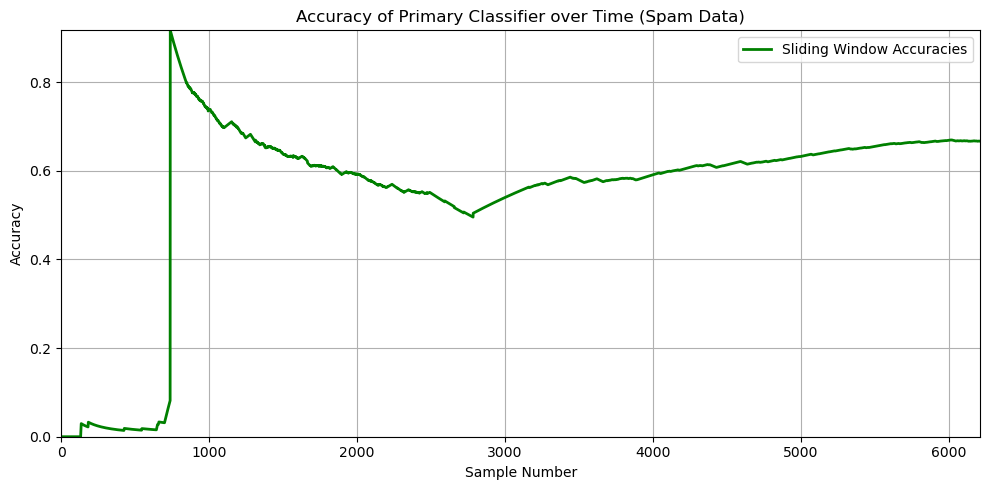

In [17]:
fig, ax = plt.subplots(figsize=(10, 5))  # Create a figure and axis with the specified size

ax.plot([i * window_size for i in range(len(sliding_window_accuracies_spam))], sliding_window_accuracies_spam, color='g', label='Sliding Window Accuracies', linestyle='-', linewidth=2)  # Plot the sliding window accuracies as a line chart with specified color, label, linestyle, and linewidth

ax.set_xlabel('Sample Number')  # Set the x-axis label
ax.set_ylabel('Accuracy')  # Set the y-axis label
ax.set_title('Accuracy of Primary Classifier over Time (Spam Data)')
# Plot the sliding window accuracies as a line chart with 
#specified color, label, linestyle, and linewidth

ax.grid(True)  # Enable grid lines in the plot

ax.set_xlim(0, (len(sliding_window_accuracies_spam) - 1) * window_size)  # Set the x-axis limits dynamically based on the number of samples and window size
ax.set_ylim(min(sliding_window_accuracies_spam), max(sliding_window_accuracies_spam))  # Set the y-axis limits dynamically based on the minimum and maximum accuracies

ax.legend()  # Show the legend

plt.tight_layout()  # Adjust the layout of the plot

plt.savefig('spam_plot.png')  # Save the plot as an image file

plt.show()  # Display the plot


## Agrawal Data:

In [18]:
# Assume that the last column is the target variable
X_agrawal = agrawal.iloc[:, :-1]
y_agrawal = agrawal.iloc[:, -1].values

# Create data streams
agrawal_stream = DataStream(X_agrawal , y_agrawal)

# Split the initial batch from the stream
X_initial, y_initial = agrawal_stream.next_sample(batch_size=1)
X_agrawal, y_agrawal = agrawal_stream.next_sample()

# Create a primary classifier and alternative classifiers
primary_clf = HoeffdingTreeClassifier()
alternate_clfs = [AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]

# Initialize classifiers using the initial batch
primary_clf.partial_fit(X_initial, y_initial)
for clf in alternate_clfs:
    clf.partial_fit(X_initial, y_initial)

# Initialize ADWIN for each classifier
primary_adwin = ADWIN()
alternate_adwins = [ADWIN() for _ in alternate_clfs]

# Initialize correct predictions counter for each classifier
primary_correct_predictions = 0
alternate_correct_predictions = [0] * len(alternate_clfs)

n_samples = 0
primary_accuracies_agrawal = []  # List to store primary classifier accuracies

window_size = max(len(y_agrawal) // 20, 1)  # Ensure window size is at least 1
sliding_window_accuracies_agrawal = []  # List to store accuracy values for each sliding window

# For each data stream
for stream_name, stream in [("Agrawal", agrawal_stream)]:
    print(f"Processing {stream_name} dataset")
    while stream.has_more_samples():
        X, y = stream.next_sample()

        # Make predictions with all classifiers
        primary_y_pred = primary_clf.predict(X)
        alternate_y_preds = [clf.predict(X) for clf in alternate_clfs]

        # If primary clf is correct, update it
        if y == primary_y_pred:
            primary_correct_predictions += 1
            primary_clf.partial_fit(X, y)

        # If any alternate clf is correct, update it
        for i, clf in enumerate(alternate_clfs):
            if y == alternate_y_preds[i]:
                alternate_correct_predictions[i] += 1
                clf.partial_fit(X, y)

        # Update ADWIN for primary clf and check for drift
        primary_adwin.add_element(int(y != primary_y_pred))

        if n_samples > 0:  # Start checking for drift after the first 5 samples
            if primary_adwin.detected_change():
                correct_prediction_rates = [correct / n_samples for correct in alternate_correct_predictions]
                best_clf_index = np.argmax(correct_prediction_rates)
                primary_clf, alternate_clfs[best_clf_index] = alternate_clfs[best_clf_index], primary_clf
                primary_adwin, alternate_adwins[best_clf_index] = alternate_adwins[best_clf_index], primary_adwin
                primary_correct_predictions, alternate_correct_predictions[best_clf_index] = alternate_correct_predictions[best_clf_index], primary_correct_predictions

                print(f"Drift detected at sample {n_samples} in {stream_name} dataset. Primary classifier has been changed to {type(primary_clf).__name__}.")

        n_samples += 1

        primary_accuracy = primary_correct_predictions / n_samples
        primary_accuracies_agrawal.append(primary_accuracy)  # Store accuracy in the list

        # If the number of samples is a multiple of the window size, calculate and store the prequential accuracy
        if n_samples % window_size == 0:
            start = n_samples - window_size
            prequential_accuracy = sum(primary_accuracies_agrawal[start:n_samples]) / window_size
            sliding_window_accuracies_agrawal.append(prequential_accuracy)

        print(f"Primary classifier ({type(primary_clf).__name__}) accuracy: {primary_accuracy:.4f}")
        

Processing Agrawal dataset
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3333
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.5000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6667
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7500
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7778
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.8000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7273
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7500
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6923
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7333
Primary classifier (HoeffdingTreeClassifier

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6906
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6929
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6950
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6972
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6993
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6944
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6966
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6986
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7007
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7027
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7047
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.7000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6954
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6974
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6928
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6883
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6976
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6986
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6962
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6939
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6949
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6959
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6936
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6946
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6957
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6967
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6977
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6987
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6964
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6974
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6984
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6961
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6831
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6815
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6822
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6830
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6837
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6821
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6829
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6836
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6843
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6828
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6835
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6842
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6849
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6856
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6864
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6871
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6903
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6908
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6897
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6902
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6890
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6895
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6900
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6889
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6878
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6883
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6888
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6893
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6898
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6903
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6908
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6913
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6680
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6680
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6702
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6706
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6753
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6756
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6752
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6756
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6759
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6763
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6766
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6770
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6773
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6777
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6769
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6773
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6776
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6762
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6764
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6767
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6761
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6764
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6767
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6761
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6764
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6766
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6769
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6772
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6774
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6777
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6779
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6782
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6785
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6816
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6818
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6820
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6822
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6818
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6813
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6815
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6817
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6812
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6807
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6810
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6812
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6814
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6809
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6812
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6814
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6845
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6840
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6842
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6844
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6846
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6848
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6850
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6846
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6848
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6843
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6846
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6848
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6850
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6845
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6847
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6843
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6810
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6812
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6808
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6810
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6806
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6808
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6809
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6805
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6807
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6809
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6805
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6807
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6809
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6805
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6807
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6809
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6830
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6832
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6828
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6830
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6831
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6833
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6835
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6836
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6833
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6834
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6836
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6833
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6834
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6836
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6838
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6834
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6777
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6778
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6780
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6776
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6778
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6775
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6776
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6773
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6775
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6776
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6778
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6774
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6776
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6778
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6774
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6776
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6748
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6750
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6751
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6748
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6748
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6748
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6751
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6753
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6750
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6706
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6698
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6698
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6682
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6683
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6681
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6679
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6680
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6681
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6682
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6683
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6681
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6682
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6683
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6681
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6682
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6758
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6759
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6758
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6758
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6759
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6760
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6761
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6762
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6762
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6761
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6761
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6762
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6761
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6761
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6762
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6763
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6756
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6757
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6757
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6758
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6759
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6757
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6756
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6756
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6755
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6756
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6754
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6752
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6751
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6752
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6750
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6748
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6744
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6698
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6698
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6698
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6698
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6706
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6702
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6704
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6704
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6704
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6704
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6704
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6702
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6703
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6705
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6704
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6704
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6705
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6705
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6705
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6706
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6706
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6706
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6698
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6677
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6679
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6679
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6678
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6677
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6675
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6675
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6675
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6675
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6675
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6675
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6673
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6674
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6697
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6696
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6695
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6691
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6686
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6685
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6684
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6683
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6687
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6688
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6689
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6690
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6694
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6692
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6693
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6699
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6701
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6700
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6740
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6739
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6743
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6747
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6750
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6750
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6748
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6749
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6746
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6745
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6741
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6737
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6738
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6736
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6735
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6734
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6733
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6732
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6731
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6708
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6730
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6729
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6728
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6727
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6726
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6725
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6724
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6723
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6722
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6720
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6719
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6718
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6716
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6715
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6709
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6710
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6711
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6712
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6713
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.6714
Primary 

## Plot of Agrawal Data:

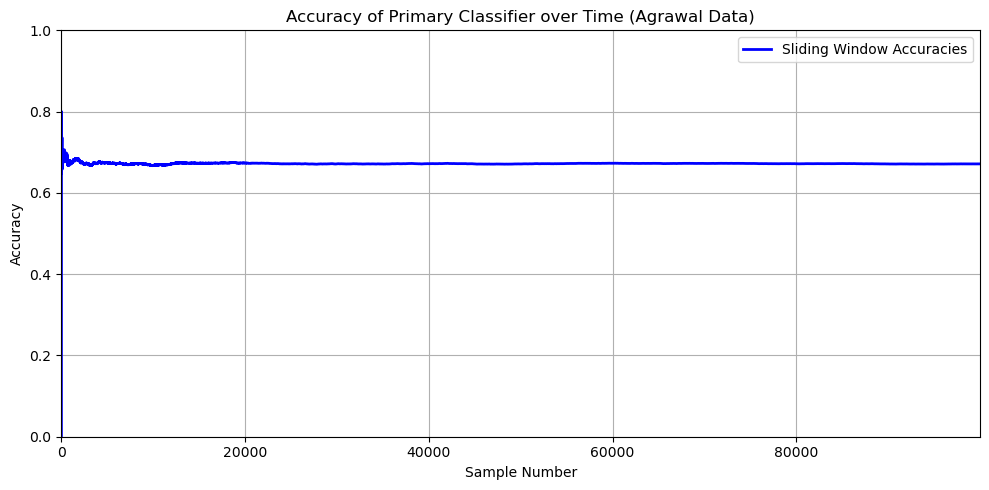

In [19]:
fig, ax = plt.subplots(figsize=(10, 5))  # Create a figure and axis with the specified size

ax.plot([i * window_size for i in range(len(sliding_window_accuracies_agrawal))], sliding_window_accuracies_agrawal, color='b', label='Sliding Window Accuracies', linestyle='-', linewidth=2)  # Plot the sliding window accuracies as a line chart with specified color, label, linestyle, and linewidth

ax.set_xlabel('Sample Number')  # Set the x-axis label
ax.set_ylabel('Accuracy')  # Set the y-axis label
ax.set_title('Accuracy of Primary Classifier over Time (Agrawal Data)')  
# Plot the sliding window accuracies as a line chart with 
#specified color, label, linestyle, and linewidth

ax.grid(True)  # Enable grid lines in the plot

# Eksen sınırlarını ayarla
ax.set_xlim(0, (len(sliding_window_accuracies_agrawal) - 1) * window_size)  # Set the x-axis limits dynamically based on the number of samples and window size
ax.set_ylim(0, 1)  # Set the y-axis limits to a fixed range of 0 to 1

ax.legend()  # Show the legend

plt.tight_layout()  # Adjust the layout of the plot

plt.savefig('agrawal_plot.png')  # Save the plot as an image file

plt.show()  # Display the plot


## Sea Data:

In [39]:
# Assume that the last column is the target variable
X_sea = sea.iloc[:, :-1]
y_sea = sea.iloc[:, -1].values

# Create data streams
sea_stream = DataStream(X_sea , y_sea)

# Split the initial batch from the stream
X_initial, y_initial = sea_stream.next_sample(batch_size=1)
X_sea, y_sea = sea_stream.next_sample()

# Create a primary classifier and alternative classifiers
primary_clf = HoeffdingTreeClassifier()
alternate_clfs = [AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]

# Initialize classifiers using the initial batch
primary_clf.partial_fit(X_initial, y_initial)
for clf in alternate_clfs:
    clf.partial_fit(X_initial, y_initial)

# Initialize ADWIN for each classifier
primary_adwin = ADWIN()
alternate_adwins = [ADWIN() for _ in alternate_clfs]

# Initialize correct predictions counter for each classifier
primary_correct_predictions = 0
alternate_correct_predictions = [0] * len(alternate_clfs)

n_samples = 0
primary_accuracies_sea = []  # List to store primary classifier accuracies

window_size = max(len(y_sea) // 20, 1)  # Ensure window size is at least 1
sliding_window_accuracies_sea = []  # List to store accuracy values for each sliding window

# For each data stream
for stream_name, stream in [("Sea", sea_stream)]:
    print(f"Processing {stream_name} dataset")
    while stream.has_more_samples():
        X, y = stream.next_sample()

        # Make predictions with all classifiers
        primary_y_pred = primary_clf.predict(X)
        alternate_y_preds = [clf.predict(X) for clf in alternate_clfs]

        # If primary clf is correct, update it
        if y == primary_y_pred:
            primary_correct_predictions += 1
            primary_clf.partial_fit(X, y)

        # If any alternate clf is correct, update it
        for i, clf in enumerate(alternate_clfs):
            if y == alternate_y_preds[i]:
                alternate_correct_predictions[i] += 1
                clf.partial_fit(X, y)

        # Update ADWIN for primary clf and check for drift
        primary_adwin.add_element(int(y != primary_y_pred))

        if n_samples > 0:  # Start checking for drift after the first 5 samples
            if primary_adwin.detected_change():
                correct_prediction_rates = [correct / n_samples for correct in alternate_correct_predictions]
                best_clf_index = np.argmax(correct_prediction_rates)
                primary_clf, alternate_clfs[best_clf_index] = alternate_clfs[best_clf_index], primary_clf
                primary_adwin, alternate_adwins[best_clf_index] = alternate_adwins[best_clf_index], primary_adwin
                primary_correct_predictions, alternate_correct_predictions[best_clf_index] = alternate_correct_predictions[best_clf_index], primary_correct_predictions

                print(f"Drift detected at sample {n_samples} in {stream_name} dataset. Primary classifier has been changed to {type(primary_clf).__name__}.")

        n_samples += 1

        primary_accuracy = primary_correct_predictions / n_samples
        primary_accuracies_sea.append(primary_accuracy)  # Store accuracy in the list

        # If the number of samples is a multiple of the window size, calculate and store the prequential accuracy
        if n_samples % window_size == 0:
            start = n_samples - window_size
            prequential_accuracy = sum(primary_accuracies_sea[start:n_samples]) / window_size
            sliding_window_accuracies_sea.append(prequential_accuracy)

        print(f"Primary classifier ({type(primary_clf).__name__}) accuracy: {primary_accuracy:.4f}")

Processing Sea dataset
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.0000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.1000
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.1818
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2500
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3077
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3571
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.4000
Primary classifier (HoeffdingTreeClassifier) ac

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3029
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3011
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2994
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2978
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2961
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2944
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2928
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2912
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2896
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2880
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2865
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2849
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2834
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2819
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2804
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2842
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2978
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2969
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2989
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2981
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2972
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2992
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3011
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3003
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.2995
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3014
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3033
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3052
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3043
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3062
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3054
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3073
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3090
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3084
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3097
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3091
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3104
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3117
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3130
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3124
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3118
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3131
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3125
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3119
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3114
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3126
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3133
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3132
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3128
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3148
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3135
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3148
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3150
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3124
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3121
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3118
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3115
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3112
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3109
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3115
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3122
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3119
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3116
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3123
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3129
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3126
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3123
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3120
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3117
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3220
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3218
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3223
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3220
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3226
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3223
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3148
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3151
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3149
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3222
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3227
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3225
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3229
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3227
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3225
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3223
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3227
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3225
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3223
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3221
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3219
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3223
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3227
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3225
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3223
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3238
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3242
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3240
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3244
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3248
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3246
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3250
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3248
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3246
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3250
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3248
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3246
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3245
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3243
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3241
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3245
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3247
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3245
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3249
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3247
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3245
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3244
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3242
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3240
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3239
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3237
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3235
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3234
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3232
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3230
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3234
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3232
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3234
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3237
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3235
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3234
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3232
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3236
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3239
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3237
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3236
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3234
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3233
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3236
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3239
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3238
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3241
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3239
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3251
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3250
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3248
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3247
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3245
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3244
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3243
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3241
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3240
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3238
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3237
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3240
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3243
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3246
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3244
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3243
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3232
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3231
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3230
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3232
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3231
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3230
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3228
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3227
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3230
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3229
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3231
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3230
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3229
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3227
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3230
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3233
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3162
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3162
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3162
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3162
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3149
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3151
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3151
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3151
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3151
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3147
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3146
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3135
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3134
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3133
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3135
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3134
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3136
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3135
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3147
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3146
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3151
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3150
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3149
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3149
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3150
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3150
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3149
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3148
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3163
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3162
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3146
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3131
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3132
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3131
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3131
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3130
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3129
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3131
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3132
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3132
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3133
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3135
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3134
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3133
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3133
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3134
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3136
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3137
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3138
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3139
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3140
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3141
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3142
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3143
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3144
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3145
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3147
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3148
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3149
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3150
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3151
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3152
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3153
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3154
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3155
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3156
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3157
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3158
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3159
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3160
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3164
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3165
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3166
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3170
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3177
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3176
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3167
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3169
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3168
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3175
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3174
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3172
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3180
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3184
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3187
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3186
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3183
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3182
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3181
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3188
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3189
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3191
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3190
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3192
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3193
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3194
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3195
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3196
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3198
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3200
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3201
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3218
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3218
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3218
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3217
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3216
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3214
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3215
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3205
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Primary 

## Plot of Sea Data:

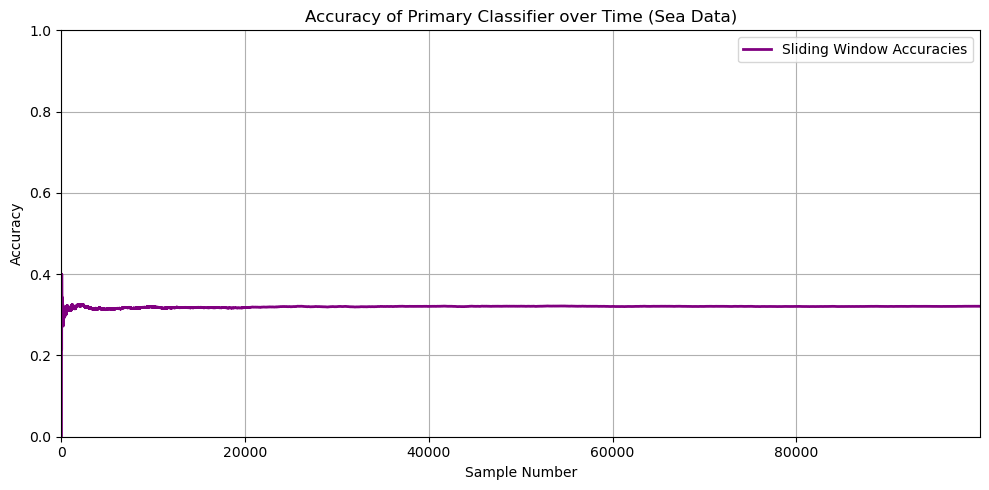

In [44]:
fig, ax = plt.subplots(figsize=(10, 5))  # Create a figure and axis with the specified size

ax.plot([i * window_size for i in range(len(sliding_window_accuracies_sea))], sliding_window_accuracies_sea, color='purple', label='Sliding Window Accuracies', linestyle='-', linewidth=2)  # Plot the sliding window accuracies as a line chart with specified color, label, linestyle, and linewidth

ax.set_xlabel('Sample Number')  # Set the x-axis label
ax.set_ylabel('Accuracy')  # Set the y-axis label
ax.set_title('Accuracy of Primary Classifier over Time (Sea Data)')  # Set the title of the plot

ax.grid(True)  # Enable grid lines in the plot

# Eksen sınırlarını ayarla
ax.set_xlim(0, (len(sliding_window_accuracies_sea) - 1) * window_size)  # Set the x-axis limits dynamically based on the number of samples and window size
ax.set_ylim(0, 1)  # Set the y-axis limits to a fixed range of 0 to 1

ax.legend()  # Show the legend

plt.tight_layout()  # Adjust the layout of the plot

plt.savefig('sea_plot.png')  # Save the plot as an image file

plt.show()  # Display the plot

# Seperate usage of classification algorithms on every dataset (Single train approach):

## Sea dataset:

In [38]:
# Assume that the last column is the target variable
X_sea = sea.iloc[:, :-1]
y_sea = sea.iloc[:, -1].values

# Create data streams
sea_stream = DataStream(X_sea , y_sea)

# List of classifiers to be used
classifiers = [HoeffdingTreeClassifier(), AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]

# Initialize correct predictions counter for each classifier
correct_predictions = [0] * len(classifiers)

# Split the initial batch from the stream
X_initial, y_initial = sea_stream.next_sample(batch_size=1)

# Initialize classifiers using the initial batch
for i, clf in enumerate(classifiers):
    clf.partial_fit(X_initial, y_initial)

n_samples = 0
window_size = max(len(y_spam) // 20, 1)  # Ensure window size is at least 1

# For each data stream
print(f"Processing Sea dataset")
while sea_stream.has_more_samples():
    X, y = sea_stream.next_sample()

    # Make predictions with all classifiers
    y_preds = [clf.predict(X) for clf in classifiers]

    # If classifier is correct, update it
    for i, clf in enumerate(classifiers):
        if y == y_preds[i]:
            correct_predictions[i] += 1
            clf.partial_fit(X, y)

    n_samples += 1

    # If the number of samples is a multiple of the window size, calculate and print the overall accuracy
    if n_samples % window_size == 0:
        print(f"Number of samples processed: {n_samples}")
        for i, clf in enumerate(classifiers):
            accuracy = correct_predictions[i] / n_samples
            print(f"Classifier ({type(clf).__name__}) accuracy: {accuracy:.4f}")


Processing Sea dataset
Number of samples processed: 310
Classifier (HoeffdingTreeClassifier) accuracy: 0.3032
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3032
Classifier (SAMKNNClassifier) accuracy: 0.6968
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3032
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3032
Number of samples processed: 620
Classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3210
Classifier (SAMKNNClassifier) accuracy: 0.6790
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3210
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3210
Number of samples processed: 930
Classifier (HoeffdingTreeClassifier) accuracy: 0.3161
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3161
Classifier (SAMKNNClassifier) accuracy: 0.6839
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3161
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3161
Number of s

Number of samples processed: 8370
Classifier (HoeffdingTreeClassifier) accuracy: 0.3171
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3171
Classifier (SAMKNNClassifier) accuracy: 0.6829
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3171
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3171
Number of samples processed: 8680
Classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3179
Classifier (SAMKNNClassifier) accuracy: 0.6821
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3179
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3179
Number of samples processed: 8990
Classifier (HoeffdingTreeClassifier) accuracy: 0.3185
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3185
Classifier (SAMKNNClassifier) accuracy: 0.6815
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3185
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3185
Number of samples processed: 93

Number of samples processed: 16430
Classifier (HoeffdingTreeClassifier) accuracy: 0.3178
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3178
Classifier (SAMKNNClassifier) accuracy: 0.6822
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3178
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3178
Number of samples processed: 16740
Classifier (HoeffdingTreeClassifier) accuracy: 0.3173
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3173
Classifier (SAMKNNClassifier) accuracy: 0.6827
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3173
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3173
Number of samples processed: 17050
Classifier (HoeffdingTreeClassifier) accuracy: 0.3179
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3179
Classifier (SAMKNNClassifier) accuracy: 0.6821
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3179
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3179
Number of samples processed:

Number of samples processed: 24490
Classifier (HoeffdingTreeClassifier) accuracy: 0.3203
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3203
Classifier (SAMKNNClassifier) accuracy: 0.6797
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3203
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3203
Number of samples processed: 24800
Classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3202
Classifier (SAMKNNClassifier) accuracy: 0.6798
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3202
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3202
Number of samples processed: 25110
Classifier (HoeffdingTreeClassifier) accuracy: 0.3202
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3202
Classifier (SAMKNNClassifier) accuracy: 0.6798
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3202
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3202
Number of samples processed:

Number of samples processed: 32550
Classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3199
Classifier (SAMKNNClassifier) accuracy: 0.6801
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3199
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3199
Number of samples processed: 32860
Classifier (HoeffdingTreeClassifier) accuracy: 0.3199
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3199
Classifier (SAMKNNClassifier) accuracy: 0.6801
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3199
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3199
Number of samples processed: 33170
Classifier (HoeffdingTreeClassifier) accuracy: 0.3197
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3197
Classifier (SAMKNNClassifier) accuracy: 0.6803
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3197
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3197
Number of samples processed:

Number of samples processed: 40610
Classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3209
Classifier (SAMKNNClassifier) accuracy: 0.6791
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3209
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3209
Number of samples processed: 40920
Classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3210
Classifier (SAMKNNClassifier) accuracy: 0.6790
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3210
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3210
Number of samples processed: 41230
Classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3210
Classifier (SAMKNNClassifier) accuracy: 0.6790
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3210
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3210
Number of samples processed:

Number of samples processed: 48670
Classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3211
Classifier (SAMKNNClassifier) accuracy: 0.6789
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3211
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3211
Number of samples processed: 48980
Classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3211
Classifier (SAMKNNClassifier) accuracy: 0.6789
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3211
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3211
Number of samples processed: 49290
Classifier (HoeffdingTreeClassifier) accuracy: 0.3212
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3212
Classifier (SAMKNNClassifier) accuracy: 0.6788
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3212
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3212
Number of samples processed:

Number of samples processed: 56730
Classifier (HoeffdingTreeClassifier) accuracy: 0.3213
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3213
Classifier (SAMKNNClassifier) accuracy: 0.6787
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3213
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3213
Number of samples processed: 57040
Classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3211
Classifier (SAMKNNClassifier) accuracy: 0.6789
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3211
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3211
Number of samples processed: 57350
Classifier (HoeffdingTreeClassifier) accuracy: 0.3210
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3210
Classifier (SAMKNNClassifier) accuracy: 0.6790
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3210
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3210
Number of samples processed:

Number of samples processed: 64790
Classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3209
Classifier (SAMKNNClassifier) accuracy: 0.6791
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3209
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3209
Number of samples processed: 65100
Classifier (HoeffdingTreeClassifier) accuracy: 0.3209
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3209
Classifier (SAMKNNClassifier) accuracy: 0.6791
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3209
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3209
Number of samples processed: 65410
Classifier (HoeffdingTreeClassifier) accuracy: 0.3211
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3211
Classifier (SAMKNNClassifier) accuracy: 0.6789
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3211
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3211
Number of samples processed:

Number of samples processed: 72850
Classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3206
Classifier (SAMKNNClassifier) accuracy: 0.6794
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3206
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3206
Number of samples processed: 73160
Classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3207
Classifier (SAMKNNClassifier) accuracy: 0.6793
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3207
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3207
Number of samples processed: 73470
Classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3208
Classifier (SAMKNNClassifier) accuracy: 0.6792
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3208
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3208
Number of samples processed:

Number of samples processed: 80910
Classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3204
Classifier (SAMKNNClassifier) accuracy: 0.6796
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3204
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3204
Number of samples processed: 81220
Classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3204
Classifier (SAMKNNClassifier) accuracy: 0.6796
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3204
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3204
Number of samples processed: 81530
Classifier (HoeffdingTreeClassifier) accuracy: 0.3204
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3204
Classifier (SAMKNNClassifier) accuracy: 0.6796
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3204
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3204
Number of samples processed:

Number of samples processed: 88970
Classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3207
Classifier (SAMKNNClassifier) accuracy: 0.6793
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3207
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3207
Number of samples processed: 89280
Classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3207
Classifier (SAMKNNClassifier) accuracy: 0.6793
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3207
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3207
Number of samples processed: 89590
Classifier (HoeffdingTreeClassifier) accuracy: 0.3206
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3206
Classifier (SAMKNNClassifier) accuracy: 0.6794
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3206
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3206
Number of samples processed:

Number of samples processed: 97030
Classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3207
Classifier (SAMKNNClassifier) accuracy: 0.6793
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3207
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3207
Number of samples processed: 97340
Classifier (HoeffdingTreeClassifier) accuracy: 0.3207
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3207
Classifier (SAMKNNClassifier) accuracy: 0.6793
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3207
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3207
Number of samples processed: 97650
Classifier (HoeffdingTreeClassifier) accuracy: 0.3208
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3208
Classifier (SAMKNNClassifier) accuracy: 0.6792
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.3208
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.3208
Number of samples processed:

## Spam Dataset:

In [27]:
# Assume that the last column is the target variable
X_spam = spam.iloc[:, :-1]
y_spam = spam.iloc[:, -1].values

# Create data streams
spam_stream = DataStream(X_spam , y_spam)

# List of classifiers to be used
classifiers = [HoeffdingTreeClassifier(), AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]

# Initialize correct predictions counter for each classifier
correct_predictions = [0] * len(classifiers)

# Split the initial batch from the stream
X_initial, y_initial = spam_stream.next_sample(batch_size=1)

# Initialize classifiers using the initial batch
for i, clf in enumerate(classifiers):
    clf.partial_fit(X_initial, y_initial)

n_samples = 0
window_size = max(len(y_spam) // 20, 1)  # Ensure window size is at least 1

# For each data stream
print(f"Processing Spam dataset")
while spam_stream.has_more_samples():
    X, y = spam_stream.next_sample()

    # Make predictions with all classifiers
    y_preds = [clf.predict(X) for clf in classifiers]

    # If classifier is correct, update it
    for i, clf in enumerate(classifiers):
        if y == y_preds[i]:
            correct_predictions[i] += 1
            clf.partial_fit(X, y)

    n_samples += 1

    # If the number of samples is a multiple of the window size, calculate and print the overall accuracy
    if n_samples % window_size == 0:
        print(f"Number of samples processed: {n_samples}")
        for i, clf in enumerate(classifiers):
            accuracy = correct_predictions[i] / n_samples
            print(f"Classifier ({type(clf).__name__}) accuracy: {accuracy:.4f}")


Processing Spam dataset
Number of samples processed: 310
Classifier (HoeffdingTreeClassifier) accuracy: 0.0194
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.7677
Classifier (SAMKNNClassifier) accuracy: 0.9806
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.0194
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.0194
Number of samples processed: 620
Classifier (HoeffdingTreeClassifier) accuracy: 0.0161
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.8774
Classifier (SAMKNNClassifier) accuracy: 0.9839
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.0161
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.0161
Number of samples processed: 930
Classifier (HoeffdingTreeClassifier) accuracy: 0.2366
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.6925
Classifier (SAMKNNClassifier) accuracy: 0.7634
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.2366
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.2366
Number of 

## Agrawal Dataset:

In [ ]:
# Assume that the last column is the target variable
X_agrawal = agrawal.iloc[:, :-1]
y_agrawal = agrawal.iloc[:, -1].values

# Create data streams
agrawal_stream = DataStream(X_agrawal , y_agrawal)

# List of classifiers to be used
classifiers = [HoeffdingTreeClassifier(), AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]

# Initialize correct predictions counter for each classifier
correct_predictions = [0] * len(classifiers)

# Split the initial batch from the stream
X_initial, y_initial = agrawal_stream.next_sample(batch_size=1)

# Initialize classifiers using the initial batch
for i, clf in enumerate(classifiers):
    clf.partial_fit(X_initial, y_initial)

n_samples = 0
window_size = max(len(y_spam) // 20, 1)  # Ensure window size is at least 1

# For each data stream
print(f"Processing Agrawal dataset")
while agrawal_stream.has_more_samples():
    X, y = agrawal_stream.next_sample()

    # Make predictions with all classifiers
    y_preds = [clf.predict(X) for clf in classifiers]

    # If classifier is correct, update it
    for i, clf in enumerate(classifiers):
        if y == y_preds[i]:
            correct_predictions[i] += 1
            clf.partial_fit(X, y)

    n_samples += 1

    # If the number of samples is a multiple of the window size, calculate and print the overall accuracy
    if n_samples % window_size == 0:
        print(f"Number of samples processed: {n_samples}")
        for i, clf in enumerate(classifiers):
            accuracy = correct_predictions[i] / n_samples
            print(f"Classifier ({type(clf).__name__}) accuracy: {accuracy:.4f}")


Processing Agrawal dataset
Number of samples processed: 310
Classifier (HoeffdingTreeClassifier) accuracy: 0.6935
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.6935
Classifier (SAMKNNClassifier) accuracy: 0.6935
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6935
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6935
Number of samples processed: 620
Classifier (HoeffdingTreeClassifier) accuracy: 0.6887
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.6887
Classifier (SAMKNNClassifier) accuracy: 0.6887
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6887
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6887
Number of samples processed: 930
Classifier (HoeffdingTreeClassifier) accuracy: 0.6742
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.6742
Classifier (SAMKNNClassifier) accuracy: 0.6742
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6742
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6742
Number 

Number of samples processed: 8370
Classifier (HoeffdingTreeClassifier) accuracy: 0.6717
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.6717
Classifier (SAMKNNClassifier) accuracy: 0.6717
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6717
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6717
Number of samples processed: 8680
Classifier (HoeffdingTreeClassifier) accuracy: 0.6721
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.6721
Classifier (SAMKNNClassifier) accuracy: 0.6721
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6721
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6721
Number of samples processed: 8990
Classifier (HoeffdingTreeClassifier) accuracy: 0.6707
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.6707
Classifier (SAMKNNClassifier) accuracy: 0.6707
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6707
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6707
Number of samples processed: 93

## Elec Dataset:

In [30]:
# Assume that the last column is the target variable
X_elec = elec.iloc[:, :-1]
y_elec = elec.iloc[:, -1].values

# Create data streams
elec_stream = DataStream(X_elec , y_elec)

# List of classifiers to be used
classifiers = [HoeffdingTreeClassifier(), AdaptiveRandomForestClassifier(), SAMKNNClassifier(), StreamingRandomPatchesClassifier(n_estimators=2), DynamicWeightedMajorityClassifier()]

# Initialize correct predictions counter for each classifier
correct_predictions = [0] * len(classifiers)

# Split the initial batch from the stream
X_initial, y_initial = elec_stream.next_sample(batch_size=1)

# Initialize classifiers using the initial batch
for i, clf in enumerate(classifiers):
    clf.partial_fit(X_initial, y_initial)

n_samples = 0
window_size = max(len(y_elec) // 20, 1)  # Ensure window size is at least 1

# For each data stream
print(f"Processing Elec dataset")
while elec_stream.has_more_samples():
    X, y = elec_stream.next_sample()

    # Make predictions with all classifiers
    y_preds = [clf.predict(X) for clf in classifiers]

    # If classifier is correct, update it
    for i, clf in enumerate(classifiers):
        if y == y_preds[i]:
            correct_predictions[i] += 1
            clf.partial_fit(X, y)

    n_samples += 1

    # If the number of samples is a multiple of the window size, calculate and print the overall accuracy
    if n_samples % window_size == 0:
        print(f"Number of samples processed: {n_samples}")
        for i, clf in enumerate(classifiers):
            accuracy = correct_predictions[i] / n_samples
            print(f"Classifier ({type(clf).__name__}) accuracy: {accuracy:.4f}")


Processing Elec dataset
Number of samples processed: 2265
Classifier (HoeffdingTreeClassifier) accuracy: 0.6049
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3951
Classifier (SAMKNNClassifier) accuracy: 0.3951
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6049
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6049
Number of samples processed: 4530
Classifier (HoeffdingTreeClassifier) accuracy: 0.6046
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3954
Classifier (SAMKNNClassifier) accuracy: 0.3954
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6046
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6046
Number of samples processed: 6795
Classifier (HoeffdingTreeClassifier) accuracy: 0.6028
Classifier (AdaptiveRandomForestClassifier) accuracy: 0.3972
Classifier (SAMKNNClassifier) accuracy: 0.3972
Classifier (StreamingRandomPatchesClassifier) accuracy: 0.6028
Classifier (DynamicWeightedMajorityClassifier) accuracy: 0.6028
Number 